<a href="https://colab.research.google.com/github/allansuzuki/Churn_Prediction/blob/main/Churn_Rate_Prediction_unsatisfied_customers.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#reinstall pandas-profiling - RUN THIS THEN RESTART KERNEL!
# ! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip (21.9 MB)


#What is Churn Rate? Why it is so important?

As we go page to page on the internet there are different approaches to calculate the churn rate and revenue evaluation. To focus in a single method, I chose the definition in [Salesforce website (+info)](https://www.salesforce.com/resources/articles/how-calculate-customer-churn-and-revenue-churn/).

By that definition, the churn rate is the _rate at which customers stop doing business with a company over a given <u>period of time</u>_. The higher the churn rate, the more customers cancel the service. The less, more customers are retained.

As we want to know about how many clients remain with the services at the beginning of the period until the end, then:

* Churn rate definition:
<br>

$$
Churn\space rate = \frac{total\space customer\space churned}{total\space customer\space at\space the\space beginning\space of\space the\space period} = \frac{churn}{customer(t_0)}
$$

> which:<br>
> $t$: period analyzed<br>
> $t_0$: beginning of the period<br>

Example: In the company ABC, at the beginning of th month 1050 clients were subscripted. 
* In the month, 100 new subscriptions that remained until the end of the month and;
* from the <mark>initial 1050</mark>, 50 churned until the end of the month.

According to churn rate definition, the rate is only interested in wath happened to the initial customers. Thus, the <mark>new subcriptions</mark> and what happened to the new ones are not took in account. That said, $churn\space rate = \frac{churn}{customer(t_0)} = \large\frac{50}{1050} = \small4.76\%$

* Churn Revenue:

Analagous to the _Churn rate_ definition, let's say in the last example:
 * from the 50 churn clients, 30 had a subscription of \\$20 and 20, \\$50. 
 * It's suppose that the revenue would be 78750 if none of the clients churn during the period. 
 
 As you may realize, there is an assumption that the total revenue in the period would be for the case in which <mark>none of the clients</mark> churn in the period. Therefore:

$$
Churn\space revenue= \frac{total\space revenue\space churned}{total\space predicted\space revenue\space in\space the\space period} = \frac{churn\space revenue}{revenue(t_0)}
$$

$$
Churn\space revenue = \frac{30\cdot20 + 20\cdot50}{78750} = 2.03\%
$$

For more complex cases regarding the calculation over more periods, in which the new customers in the period affect the churn rate calculated, [see more details here](https://www.salesforce.com/resources/articles/how-calculate-customer-churn-and-revenue-churn/#calculating-customer-churn-rate-cohort-analysis). In complement, there are more details about the pros and cons in the churn rate approach [(+info)](https://www.investopedia.com/terms/c/churnrate.asp#mntl-sc-block_1-0-21).

# Exploratory Data Analysis (EDA)

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [ ]:
raw = pd.read_csv("https://raw.githubusercontent.com/carlosfab/dsnp2/master/datasets/WA_Fn-UseC_-Telco-Customer-Churn.csv")

In [ ]:
raw.info

<bound method DataFrame.info of       customerID  gender  SeniorCitizen Partner Dependents  tenure  \
0     7590-VHVEG  Female              0     Yes         No       1   
1     5575-GNVDE    Male              0      No         No      34   
2     3668-QPYBK    Male              0      No         No       2   
3     7795-CFOCW    Male              0      No         No      45   
4     9237-HQITU  Female              0      No         No       2   
...          ...     ...            ...     ...        ...     ...   
7038  6840-RESVB    Male              0     Yes        Yes      24   
7039  2234-XADUH  Female              0     Yes        Yes      72   
7040  4801-JZAZL  Female              0     Yes        Yes      11   
7041  8361-LTMKD    Male              1     Yes         No       4   
7042  3186-AJIEK    Male              0      No         No      66   

     PhoneService     MultipleLines InternetService OnlineSecurity  ...  \
0              No  No phone service             DSL 

## Variables (or columns)

* `Customer ID`: Customer unique ID

* `gender`: Whether the customer is a male or a female

* `SeniorCitizen`: Whether the customer is a senior citizen or not (1, 0)
* `Partner`: Whether the customer has a partner or not (Yes, No)
* `Dependents`: Whether the customer has dependents or not (Yes, No)
* `tenure`: Number of months the customer has stayed with the company
* `PhoneService`: Whether the customer has a phone service or not (Yes, No)
* `MultipleLines`: Whether the customer has multiple lines or not (Yes, No, No phone service)
* `InternetService`: Customer’s internet service provider (DSL, Fiber optic, No)
* `OnlineSecurity`: Whether the customer has online security or not (Yes, No, No internet service)
* `OnlineBackup`: Whether the customer has online backup or not (Yes, No, No internet service)
* `DeviceProtection`: Whether the customer has device protection or not (Yes, No, No internet service)
* `TechSupport`: Whether the customer has tech support or not (Yes, No, No internet service)
* `StreamingTV`: Whether the customer has streaming TV or not (Yes, No, No internet service)
* `StreamingMovies`: Whether the customer has streaming movies or not (Yes, No, No internet service)
* `Contract`: The contract term of the customer (Month-to-month, One year, Two year)
* `PaperlessBilling`: Whether the customer has paperless billing or not (Yes, No)
* `PaymentMethod`: The customer’s payment method (Electronic check, Mailed check, Bank transfer (automatic), Credit card (automatic))
* `MonthlyCharges`: The amount charged to the customer monthly
* `TotalCharges`: The total amount charged to the customer
* `Churn`: Whether the customer churned or not (Yes or No)

* **The problem with categorical like string variables**:

> In machine learning, in general, algorithms calculate the coefficient matrix that minimize a loss function. In other words, calculate the numbers that fits best to predict as similar as possible the real situation, based on sample data. Therefore, all the variables must be numerical data, **except tree-based algorithms (e.g. XGBoost)**

## Pandas Profiling package vs standard analysis

Most of the data is analyzed through extenses and repetetive functions in a pandas `DataFrame`. In terms of learningMost of the data is analyzed through extenses and repetetive functions in a pandas `DataFrame`. In terms of learning enviroment and kick starting techniques, there is no doubt these functions are essential. On the other hand, as logical thinkers and data scientists, it's obvious there are patterns in these techniques. Thus, in order to save time, but most to show a different approach to the community, I've use the `pandas-profiling` package [(+info)](https://pandas-profiling.ydata.ai/docs/master/index.html)

In summary, `pandas-profiling` package is able to generates profile reports from a pandas `DataFrame`. It may detect type of columns, missing and duplicated values report, quantile and descriptive statistics, even alerts of high correlations, zeros, skewness, and so on, in a **SINGLE COMMAND LINE** (as default):

```python
df.profile_report()
```

It can also be used to generate profiling reports:
```python
profile = ProfileReport(df, title="Pandas Profiling Report")
```
and in google Colab, it can be used in Jupyter Notebooks [(+info)](https://python.plainenglish.io/how-to-use-pandas-profiling-on-google-colab-e34f34ff1c9f) in two ways, shown by the animations:

1. exibing in a set of widgets:
```
profile.to_widgets()
```
![how 'to_widget()' works](https://pandas-profiling.ydata.ai/docs/master/_images/widgets.gif)


2. or exibing as embbed cell **(preferable)**:
```
profile.to_notebook_iframe()
```
![how 'to_notebook_iframe' works](https://pandas-profiling.ydata.ai/docs/master/_images/iframe.gif)


And it can be used in google colab with ~~almost~~ no problems. Because, in the first time using Google Colab, it raises an error:
```python
TypeError: concat() got an unexpected keyword argument 'join_axes'
```

The problem is Google Colab preload an older version of `pandas-profiling`, which uses a deprecated function, raising the error above [(+info)](https://python.plainenglish.io/how-to-use-pandas-profiling-on-google-colab-e34f34ff1c9f)

* Solving the problem on Google Colab

To solve this, just need to:

1. Install the new version in Google Colab:
```
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 
```

2. Restart the kernel
Go to `Runtime` > `Restart Kernel` (or, by default, Ctrl+M .)

3. Rerun the import libraries

And it's all set!

In [ ]:
#import pandas-profiling
from pandas_profiling import ProfileReport
#restart kernel (manuallly)

In [ ]:
rpt = ProfileReport(raw)

In [ ]:
# FULL-DATA(CHURN-and-NON-CHURN-CUSTOMERS)
rpt.to_notebook_iframe()
# Value types: 14 Categorical, 5 Boolean, 2 Numeric
# Missing values? Duplicated values? No
# Distribution

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

* **Average <u>churned</u> customer profile (TODO)**

In [ ]:
profile_onlyChurn = ProfileReport(raw[raw['Churn']=='Yes'])
profile_onlyChurn.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Analysis and Insights

* **Average customer profile**

> <p align="justify">Regarding the distribution of variables, `gender` and `Partner` are incredibly well balanced, almost 50% 50%. Most of the clients are not senior people. The customers stayed with active subscription beween 0 and 72 months (6 years), and two peaks with majority in 0 and 72 months. Some customers had extra services from the company, like phone lines, online backup, streming TV, among others. The majority paid with electronic methods without automatic debit. About the monthly charge, there is a peak in near 18.25 and an almost normal distribution between 40 and 118.75.
Regarding the churn state, from 7043 customers in the dataset, 1869 (~26.54%) customers deactivated their subscription.</p>

* **Average churned customer profile**

> <p align="justify">Regarding the distribution of variables, `gender` and `Partner` are again incredibly well balanced. Most of the clients are not senior people. The churned customers stayed with active subscription beween 0 and 18 months (1 year and a half). Most customers had only phone and Fiber optic services, which is usually the default package The contract is in majority month-to-month. The majority paid with electronic methods without automatic debit. About the monthly charge, there is a peak in near 18.85 and a concentration between the values 70 and 118.35, which is more than the mean from full data.

* **Correlation analysis**

> According to $\phi_K$ correlation, the `Churn` is strongly related to `tenure`, `PaymentMethod` and `MonthlyCharges`, which will be our focus on bivariative relation analysis.


> Also, the `MonthlyCharges` can be strongly related to services acquisition in the subscription, i.e, if the client has several services, the charge monthly will be higher than one-service customers. This supports there is no need to analyze the services variables (unless it's needed to analyze if a particular service was the cause of the churns).



### About $\phi_K$ correlation

Phik ($\phi_K$) is a new and pactical correlation coefficient that works consistently with <big>**categorical, ordinal and interval variables**</big>. It also detect non-linear dependency and reverts to Pearson correlation in case of bivariate normal input distribution [(+info)](https://phik.readthedocs.io/en/latest/index.html).

<p align="justify"> Moreover, a problem present in popular libraries' assumption for low to medium statistics data samples was fixed using this correlation, assuring assertiveness</p>

Therefore, the new correlation *is particularly useful in modern-day analysis when studying the dependencies between a set of variables with mixed types, where often some variables are categorical* (extracted from the documentation), justifing its use.

### Outliers Analysis

* `Tenure`: No outliers

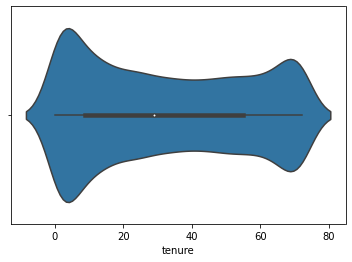

In [ ]:
sns.violinplot(x=raw['tenure'])

* `MonthlyCharge`: No outliers

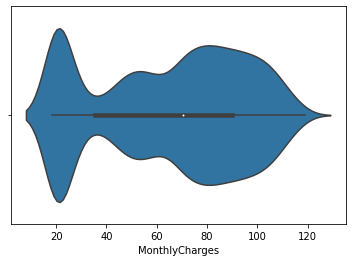

In [ ]:
sns.violinplot(x=raw['MonthlyCharges'])

#### Z-Score analysis

It's already expected there are no outliers, but this section has the main goal to <mark>present an easy and fast automatic outlier remove technique</mark>.

Z-score is the number of standard deviations $\sigma$ a certain data is away from the mean, i.e., the distance between the data and the mean of the distribution. [(+info)](https://datasciencesphere.com/analytics/5-easy-ways-to-detect-outliers-in-python/)

It's usually used when the data has a normal distribution. The formula is the following:

<br>
<center><img src = "https://datasciencesphere.com/wp-content/uploads/2022/01/z-score-standard-normal-distribution.png" width=30%></center><br>

\begin{align}
  z = \frac{x-\mu}{\sigma};\space \sigma = \sqrt{\frac{(x-\mu)^2}{n}}
\end{align}

where:

> <ul type="None">
> <li>$z$: Z-Score</li>
> <li>$x$: cetain data</li>
> <li>$\mu$: data mean</li>
> <li>$\sigma$: data standard deviation</li>
> <li>$n$: number of observations


A usual threshold is any data point further than 3 standard deviations, i.e, $outliers: (z<-3) \space\&\space (z>3)$, which covers 99.7% of the values in a normal distribution.

This technique can be implement by the `scipy` package, using the `stats.zscore()` function.

In [ ]:
from scipy import stats

#Calculate the z-scores
## only 2 numerical variables
numcols = ['tenure','MonthlyCharges']
zscore = stats.zscore(raw[numcols])

#convert to absolute values
abs_zscore = np.abs(zscore)

#remove outliers
mask = (abs_zscore<3).all(axis=1)
print(f"Size original data: {len(raw)}\nSize w/o outliers: {len(raw[mask])}")

Size original data: 7043
Size w/o outliers: 7043


### Churn x other variables

* `Tenure` x `MonthlyCharges`:

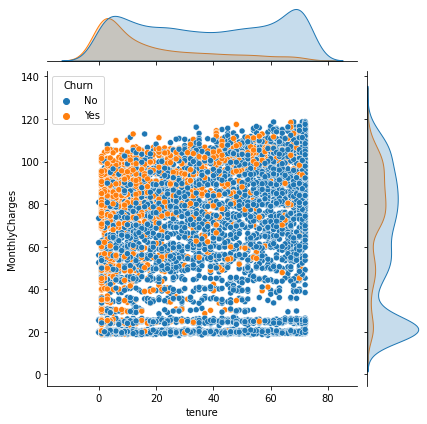

In [ ]:
sns.jointplot(data=raw, x='tenure',y='MonthlyCharges',hue='Churn');

<a name="possible-model"></a>
<p align="justify">It's quite possible to draw a plane which divides the churn and non-churn customers, just analyzing this relation and distributions, which <mark>reinforces its possibility to apply tree-based algorithms</mark>.</p>

<p align="justify">First, the majority of churned customers stayed with active subscription for no more than 18 months (1.5 year). On the other hand, faithful customers pay less than 30 per month. These clauses that divides the data, <mark>reinforce even more the usage of tree-based algorithms</mark>.</p>

* `PaymentMethod`:

PaymentMethod              Churn
Bank transfer (automatic)  No       1286
                           Yes       258
Credit card (automatic)    No       1290
                           Yes       232
Electronic check           No       1294
                           Yes      1071
Mailed check               No       1304
                           Yes       308
dtype: int64


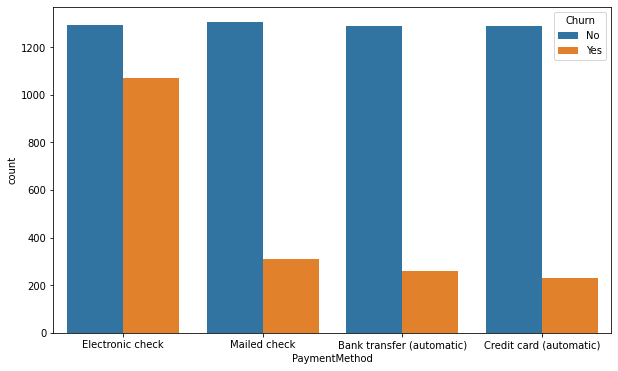

In [ ]:
plt.figure(figsize=(10,6))
sns.countplot(data=raw, x='PaymentMethod', hue='Churn');
print(raw.groupby(['PaymentMethod','Churn']).apply(len))

It's clear the `Eletronic check` is the main payment method for churn customers. There is no clear reason and it's no a cause-effect relation.

Regarding to social variables, like `gender`,`dependents`, it can be important a marketing recall action, but it's not a relation that leads to churn, in general.

Therefore, to better understand the variables and effects on the churn, in the following section the model will be build, using the whole dataset and `Tenure`, `MonthlyCharges` and `PaymentMethod` variables only.

# Model building

## Model selection

Pre-processing is the step in modeling which the data is treated to better use by the algorithm. As we metioned [before](#possible-model), a tree-based algorithm will be implemented to generate the model.


One of the most well-known and robust algorithm is the <u>XGBoost</u>.

* **XGBoost**

<justify>e**X**treme **G**radient **Boost**ing, also known as XGBoost, is a tree-based algorithm which uses Gradiente Descent algorithm to minimize the loss function. Basically, its features are:</justify>

* How it works

XGBoost is an <mark>ensamble</mark> type algorithm, i.e., it combines different algorithms to build it. Then, it's crucial to understand what are them:

1. **Decision tree** [(+info)](https://www.ibm.com/topics/decision-trees): Let's imagine we want know if it's possible to go surfing based on climate behavior. According to the image below, this algorithm consists of a root node, which divides the data based on a decision question. Thereafter, come decision nodes from the root node, as much as need, but less than the maximum allowed by the model parameters. Finally, the outcome is the leaves. Therefore, it's a <u>visual tree upside down</u>.<br><br>
<center><img src="https://www.ibm.com/content/dam/connectedassets-adobe-cms/worldwide-content/cdp/cf/ul/g/10/3c/Decision-Tree-Example.component.complex-narrative-xl.ts=1640801899950.png/content/adobe-cms/us/en/topics/decision-trees/jcr:content/root/table_of_contents/intro/complex_narrative/items/content_group_1441304462/image" alt="Example of decision tree"></center><br><br>
One main problem of decision tree is that as much as complex it becomes, more detailed it is, guaranteeing 100% accuracy in the training data, but it performs worse than average in test data and new data as well. It's called <mark>overfitting</mark> [(+info)](https://www.datarobot.com/wiki/overfitting/). In order to avoid that, the ensemble becomes important.<br><br>

2. **Random Forest** [(+info)](https://www.section.io/engineering-education/introduction-to-random-forest-in-machine-learning/): As we know, a single decision tree can be far complex and overfit training data, or too simple and underfit it. A solution for this problem is the random forest, which consists of a decision tree ensemble, each one called regressor/classifier with many different decision roots. Each one gives an output, and the final output is the mean/major decision of all regressors/classifiers, respectively.<br><br>
<center><img src="https://www.section.io/engineering-education/introduction-to-random-forest-in-machine-learning/random-forest-classifier.png" width=80% alt="Example of random forest classifier"><center><br><br>

3. **Boosting trees** [(+info)](https://xgboost.readthedocs.io/en/stable/tutorials/model.html#objective-function-training-loss-regularization): In order get more accurate prediction but not overfit the data, XGBoost has the main goal to create brand new decision trees which makes <mark>better prediction than the classifier/regressor before, iteratively</mark>. But how do we measure if the new tree is better than the last one or if it's good enough? We need to define an <mark>objective function</mark>:<br><br>
$$obj(\theta) = L(\theta) + \Omega(\theta)$$
where,<br>
> $\theta$: best model parameters<br>
$L$: loss function - quantifies error<br>
$\Omega$: regularization term - quantifies model complexity<br>

The idea behind is minimize the objective function, i.e, we want the best parameters $\theta$ which gives the the least error as possible ─ minimize loss function $L$ ─ and also the least complexity as possible ─ minimize regularization term $\Omega$. Further details and insights about these functions [here](https://xgboost.readthedocs.io/en/stable/tutorials/model.html#objective-function-training-loss-regularization).

Therefore, the new generated tree which minimizes the objective function is an <mark>optimum choice</mark> of regressor/classifier to fit the ensemble.

That's a glimpse of how XGBoost works.


## Pre-Processing


According to [Praveen Thenraj](https://towardsdatascience.com/do-decision-trees-need-feature-scaling-97809eaa60c6), there is no need to apply feature scaling in the dataset used by tree-based algorithms, because they split the data in the features in the tree, and it's not impacted by outliers. Therefore, a transformed tree and the original one are the same tree, with the same features, but in different scale.

On the other hand, machine learning models need aritmetic input to fit data and give predictions. That said, categorical features/variables are mostly strings and must be preprocessed.

In this section we will discuss about **Label Encoder** and **One-hot Encoder** techniques

### Label Encoder (TODO)

* what is?
* when is used for?

### One-hot Encoder (TODO)

* what is?
* when is used for?

## Building the model

###**Train test split**

In [ ]:
from sklearn.model_selection import train_test_split

#Split to feature and target matrix
# X = raw.drop('Churn',axis=1)  #full
cols = ['tenure','MonthlyCharges','PaymentMethod']
X = raw[cols].astype({'PaymentMethod':'category'},errors='raise')
y = raw['Churn'].astype('category')

#Split to train and test dataset
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=.15)  # Train:85% Test:15%

### **Balance data**

As shown in [other project (+info)](https://colab.research.google.com/drive/1Wy49gapgdieOC0eNznXGn6kH0JKD7Ma9#scrollTo=safX5xIEc0ZH), it's expressive the difference between unbalanced and balanced data. Out target is to define if a client would churn or not. Therefore, it a model learns more about non-churned clients, it would probably predict badly False-positive and False-Negatives, which are our critical KPIs.

In [ ]:
#import under_sampling method
from imblearn.under_sampling import RandomUnderSampler

#fit and resample the data
rus = RandomUnderSampler(random_state=11)
X_train_bal, y_train_bal = rus.fit_resample(X_train,y_train)

### **Define model parameters**

To better understand the XGBoost hyperparameters [(+info)](https://xgboost.readthedocs.io/en/stable/parameter.html#parameters-for-tree-booster), follows some mathematics [(+info)](https://medium.com/@aln.deaguiar/xgboost-a-matem%C3%A1tica-passo-a-passo-29d34fa561dc) and parameters in the list:

* `n_estimators`: Number of boosting rounds, i.e, how many trees in ensemble;
* `max_depth`: Maximum level of decision nodes;
* `learning_rate`: $\eta$ (eta) Step size shrinkage used in update to prevents overfitting. After each boosting step, we can directly get the weights $w_j$ of new features, and $\eta$ shrinks the feature weights to make the boosting process more conservative. Range value $[0,1]$;

$$w_j = \color{red}\eta\frac{-\sum_{iϵI_j}g_i}{\sum_{iϵI_j}(h_i+\lambda)}$$

* `gamma`: $\gamma$ (gamma) Minimum loss reduction required to make a further partition on a leaf node of the tree, i,e, if the gain of the new node doesn't surpass the minimum loss gamma, it won't be added. The larger gamma is, the more conservative the algorithm will be. Range value $(0,∞)$;

\begin{align}
  \begin{cases}
    gain = L_{left} + L_{right} - L_{before}\\
    \large L = -\frac{1}{2}\sum_{j=1}^T{\frac{(\sum_{iϵI_j}g_i)^2}{\sum_{iϵI_j}(h_i+\lambda)}}+\color{red}\gamma\space T\\
  \end{cases}
\end{align}

\begin{align}
gain = \frac{1}{2}\left[\sum_{j=1}^T{\frac{(\sum_{iϵI_{\space left}}g_i)^2}{\sum_{iϵI_{\space left}}(h_i+\lambda)}} + \sum_{j=1}^T{\frac{(\sum_{iϵI_{\space right}}g_i)^2}{\sum_{iϵI_{\space right}}(h_i+\lambda)}} + \sum_{j=1}^T{\frac{(\sum_{iϵI_j}g_i)^2}{\sum_{iϵI_j}(h_i+\lambda)}}\right] - \color{red}\gamma
\end{align}

* `subsample`: Subsample ratio of the training instances. Example: setting it to 0.5 means that XGBoost would randomly sample half of the training data prior to growing trees. This will prevent overfitting. Subsampling will occur <mark>once in every boosting iteration</mark>. Range value $(0,1]$

* `colsample_bytree`: Similar to `subsample`, subsample ratio of columns when constructing each tree. Example: if set to 0.5, sample randomly half of the columns to train the trees. Subsampling occurs <mark>once for every tree constructed</mark>. Range value $(0,1]$

In [ ]:
from xgboost import XGBClassifier

# MODEL
## building model and setting hyperparams
xgb = XGBClassifier(
    n_estimators = 400,
    max_depth = 4,
    learning_rate= 0.05,
    gamma = 1,
    subsample = .85,
    colsample_bytree = .3,
    # enable_categorical = True  #accept category features, enable in version>1.5
    random_state=11
)

### Make pipeline

In [ ]:
#-------IMPORTS------------
#import pipeline
from sklearn.pipeline import Pipeline

#import one hot encoding
from sklearn.preprocessing import OneHotEncoder  #transform string categorical variables

#import ColumnTransformer - apply a transform in the original data specifing variables/columns
#practical example: https://scikit-learn.org/stable/auto_examples/compose/plot_column_transformer_mixed_types.html
from sklearn.compose import ColumnTransformer

#import selector - automate column selector
from sklearn.compose import make_column_selector as colsSelector
#/-------IMPORTS------------


#-------MAKE PIPELINE-------
## set categorical transformer
categorical_transformer = OneHotEncoder(handle_unknown="ignore")

## set variables to transform
categorical_var = colsSelector(dtype_include='category')  #select only category columns
# categorical_var = ["PaymentMethod"]  #categorical columns --- obsolete

## make preprocessor
preprocessor = ColumnTransformer(
    transformers=[('cat',categorical_transformer,categorical_var)],
    remainder='passthrough'  #join the untreated variables with the new ones
)

## make pipeline
pipe = Pipeline(
    steps=[('preproc',preprocessor),
           ('model',xgb)]
)
#/-------MAKE PIPELINE-------

#MODEL fit
pipe.fit(X_train,y_train.values)

Pipeline(steps=[('preproc',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7f0ce4b342d0>)])),
                ('model',
                 XGBClassifier(colsample_bytree=0.3, gamma=1,
                               learning_rate=0.05, max_depth=4,
                               n_estimators=400, random_state=11,
                               subsample=0.85))])

In [ ]:
#copy estimator and fit balance data
from sklearn.base import clone

xgb_bal = clone(xgb)

## make pipeline
pipe_bal = Pipeline(
    steps=[('preproc',preprocessor),
           ('model',xgb_bal)]
)
#/-------MAKE PIPELINE-------

#MODEL fit
pipe_bal.fit(X_train_bal,y_train_bal.values);

## Variables significance

In [ ]:
#print balanced and unbalanced data
for tag_data,X_data in zip(["UNBALANCED DATA","BALANCED DATA"],[X_train,X_train_bal]):
  print(f"{tag_data} : {X_data['PaymentMethod'].count()} total \n {X_data['PaymentMethod'].value_counts()}\n")

UNBALANCED DATA : 5986 total 
 Electronic check             2022
Mailed check                 1367
Bank transfer (automatic)    1306
Credit card (automatic)      1291
Name: PaymentMethod, dtype: int64

BALANCED DATA : 3204 total 
 Electronic check             1290
Mailed check                  691
Bank transfer (automatic)     629
Credit card (automatic)       594
Name: PaymentMethod, dtype: int64



In [ ]:
#determine columns order
# pd.DataFrame(preprocessor.fit(X_train).transform(X_train)).sum()

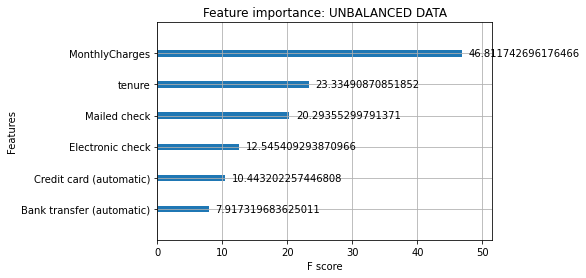

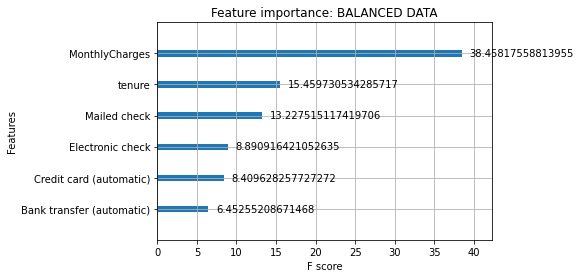

In [ ]:
from xgboost import plot_importance
# new order: first the one-hot labels sorted ABC + the following features
#it's seen by pipe['preproc'].fit_transform(X_train)

for tag_data,X_data,pipe_data in zip(["UNBALANCED DATA","BALANCED DATA"],[X_train,X_train_bal],[pipe,pipe_bal]):
  feature_names = list(sorted(X_data['PaymentMethod'].unique()))+X_data.columns[:-1].values.tolist() 
  plot_importance(pipe_data['model'],importance_type='gain').set_yticklabels(feature_names);
  plt.title(f"Feature importance: {tag_data}")

# feature_names = list(sorted(X_train['PaymentMethod'].unique()))+X_train.columns[:-1].values.tolist() 
# plot_importance(xgb,importance_type='gain').set_yticklabels(feature_names);

# xgb.feature_importances_  #just numbers
#https://towardsdatascience.com/be-careful-when-interpreting-your-features-importance-in-xgboost-6e16132588e7

In [ ]:
#model test

#import metrics
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score

for tag_data,pipe_data in zip(["UNBALANCED DATA","BALANCED DATA"],[pipe,pipe_bal]):
  y_pred = pipe_data.predict(X_test)
  cm = confusion_matrix(y_test,y_pred,labels=['No','Yes'])
  cr = classification_report(y_test,y_pred)
  acc = accuracy_score(y_test,y_pred)
  print(tag_data)
  print("CONFUSION MATRIX\n", cm) #TN, FP, FN, TP
  print("\nCLASSIFICATION REPORT\n", cr)
  print(f"{tag_data} MODEL ACCURACY: {acc:.2%}")
  print("\n----------") #TN, FP, FN, TP

UNBALANCED DATA
CONFUSION MATRIX
 [[737  53]
 [158 109]]

CLASSIFICATION REPORT
               precision    recall  f1-score   support

          No       0.82      0.93      0.87       790
         Yes       0.67      0.41      0.51       267

    accuracy                           0.80      1057
   macro avg       0.75      0.67      0.69      1057
weighted avg       0.79      0.80      0.78      1057

UNBALANCED DATA MODEL ACCURACY: 80.04%

----------
BALANCED DATA
CONFUSION MATRIX
 [[589 201]
 [ 77 190]]

CLASSIFICATION REPORT
               precision    recall  f1-score   support

          No       0.88      0.75      0.81       790
         Yes       0.49      0.71      0.58       267

    accuracy                           0.74      1057
   macro avg       0.69      0.73      0.69      1057
weighted avg       0.78      0.74      0.75      1057

BALANCED DATA MODEL ACCURACY: 73.70%

----------


**UNBALANCED DATA**

Conf_matrix | pred_NO | pred_YES | sum_true |
-|-|-|-
true_NO | 737 (TN) | 53 (FP) | *790*
true_YES | 158 (FN) | 109 (TP) | *267*
sum_pred | *895* | *162* | **1057**

<br>

**BALANCED DATA**

Conf_matrix | pred_NO | pred_YES | sum_true |
-|-|-|-
true_NO | 589 (TN) | 201 (FP) | *790*
true_YES | 77 (FN) | 190 (TP) | *267*
sum_pred | *666* | *391* | **1057**

As shown above, there is a clear trade-off situation: As the unbalanced data has more samples of non-churned customers, the model is biased to detect more non-churned customers. On the other hand, it misspredicted more than half of true churned customers.

About the balanced data anlysis, the overall accuracy of the model decreased in comparison with the unbalanced data, but the **FN**, i.e., the churned clients that was not detected by the model, decreased more than the unbalanced data, as well more churned clients were better predicted, **TP**.

* What is the best model?

>It depends on the business target. If the business doesn't want to bother the loyal clients and, for some reason, it would lose more by importunating clients than allow canceling subscriptions, than the first model obviously would be the best.<br>
>On the other hand, for those business that importunate clients wouldn't cost as much as lose churned like clients, the second model would be the best.

But there still there is hope to get a better model: *hyperparameters or model tuning.*

## Tuning model

In [ ]:
#GRID SEARCH + CROSS VALIDATION
#import Grid Search
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score,recall_score,make_scorer


#define hyperparameters range
param_grid = {
    'n_estimators': np.multiply(list(range(1,6)),100),
    'max_depth':  [5],
    'learning_rate': np.multiply([10e-3,10e-2,10e-1],5),
    'gamma' : [1,10e1],
    'subsample' : [.85],
    'colsample_bytree' : np.divide(list(range(2,4)),10)
    # enable_categorical = True  #accept category features, enable in version>1.5
}

#define metrics to measure
recall = make_scorer(recall_score,pos_label='Yes')

#instance grid search
gridSearch = GridSearchCV(pipe['model'],param_grid,cv=5,scoring={
    'acc':'accuracy',
    'recall':recall},refit=False)

#see score
gridSearch.fit(pipe['preproc'].fit_transform(X_train_bal),y_train_bal)


GridSearchCV(cv=5,
             estimator=XGBClassifier(colsample_bytree=0.3, gamma=1,
                                     learning_rate=0.05, max_depth=4,
                                     n_estimators=400, random_state=11,
                                     subsample=0.85),
             param_grid={'colsample_bytree': array([0.2, 0.3]),
                         'gamma': [1, 100.0],
                         'learning_rate': array([0.05, 0.5 , 5.  ]),
                         'max_depth': [5],
                         'n_estimators': array([100, 200, 300, 400, 500]),
                         'subsample': [0.85]},
             refit=False,
             scoring={'acc': 'accuracy',
                      'recall': make_scorer(recall_score, pos_label=Yes)})

In [ ]:
# get best params
# which are the best params? The more accurate possible but slower or the fastest but not the best accuracy?

# FASTEST
# define scoring by:
# get all the params better than the last measured: accuracy: 75% 
# from them, get all the best in a one \sigma (std) below the best model in recall
# from them, get the fastest model

def the_best_and_fast(cv_results,threshold):
  #df for cv_results_
  df_results=pd.DataFrame(gridSearch.cv_results_)

  #results better than threshold
  results_better_than_before = df_results.query(f'mean_test_acc>{threshold}')

  #best results in terms of recall
  sigma_recall = results_better_than_before['mean_test_recall'].std()
  max_recall = results_better_than_before['mean_test_recall'].max()
  threshold_recall = max_recall - sigma_recall
  results_best_recall = results_better_than_before.query(f'mean_test_recall>{threshold_recall}')

  #fastest model from filtered data
  best_idx = results_best_recall['mean_score_time'].idxmin()
  results = results_best_recall
  return best_idx,results

#get model accuracy = threshold_before
y_pred = pipe_bal.predict(X_test)
threshold_before = accuracy_score(y_test,y_pred)

#get best_params
results = gridSearch.cv_results_

best_idx,best_results = the_best_and_fast(results,threshold=threshold_before)
best_params = results['params'][best_idx]

In [ ]:
#get step values
# gridSearch.cv_results_

In [ ]:
#get best_params -obsolete if not determined by scoring
# gridSearch.best_params_

In [ ]:
#set model with the best params
xgb_best = clone(xgb)
xgb_best.set_params(**best_params)  #must set **kwargs

pipe_best = Pipeline(
    steps=[('preproc',preprocessor),
    ('model',xgb_best)]
)

pipe_best.fit(X_train_bal,y_train_bal)

Pipeline(steps=[('preproc',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7f0ce4b342d0>)])),
                ('model',
                 XGBClassifier(colsample_bytree=0.3, gamma=1,
                               learning_rate=0.05, max_depth=5,
                               n_estimators=200, random_state=11,
                               subsample=0.85))])

## Evaluate model

In [ ]:
for tag_data,pipe_data in zip(["BALANCED DATA","BEST PARAMS"],[pipe_bal,pipe_best]):
  y_pred = pipe_data.predict(X_test)
  cm = confusion_matrix(y_test,y_pred,labels=['No','Yes'])
  cr = classification_report(y_test,y_pred)
  acc = accuracy_score(y_test,y_pred)
  print(tag_data)
  print("CONFUSION MATRIX\n", cm) #TN, FP, FN, TP
  print("\nCLASSIFICATION REPORT\n", cr)
  print(f"{tag_data} MODEL ACCURACY: {acc:.2%}")
  print("\n----------") #TN, FP, FN, TP

BALANCED DATA
CONFUSION MATRIX
 [[589 201]
 [ 77 190]]

CLASSIFICATION REPORT
               precision    recall  f1-score   support

          No       0.88      0.75      0.81       790
         Yes       0.49      0.71      0.58       267

    accuracy                           0.74      1057
   macro avg       0.69      0.73      0.69      1057
weighted avg       0.78      0.74      0.75      1057

BALANCED DATA MODEL ACCURACY: 73.70%

----------
BEST PARAMS
CONFUSION MATRIX
 [[594 196]
 [ 77 190]]

CLASSIFICATION REPORT
               precision    recall  f1-score   support

          No       0.89      0.75      0.81       790
         Yes       0.49      0.71      0.58       267

    accuracy                           0.74      1057
   macro avg       0.69      0.73      0.70      1057
weighted avg       0.79      0.74      0.75      1057

BEST PARAMS MODEL ACCURACY: 74.17%

----------


After some effort by setting the best hyperparameters, the model accuracy increased 0.47 percentual points.

It's also some interesting part of the data science job: usually there is not huge difference between the initial state and tuned model, but a high performance, as we got the <mark>fastest model among the best parameters</mark>.


#Final model visualization

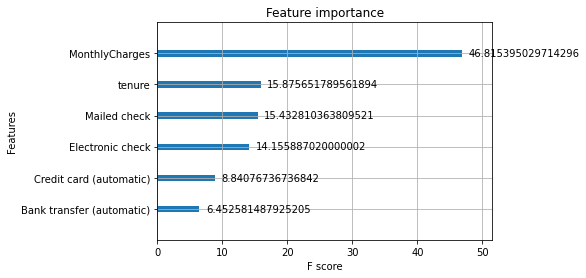

In [ ]:
# from xgboost import 
#get booster model instance
best_tree = pipe_best['model'].get_booster()

#plot variable importance
plot_importance(best_tree,importance_type='gain',title='Feature importance: best tree').set_yticklabels(feature_names);


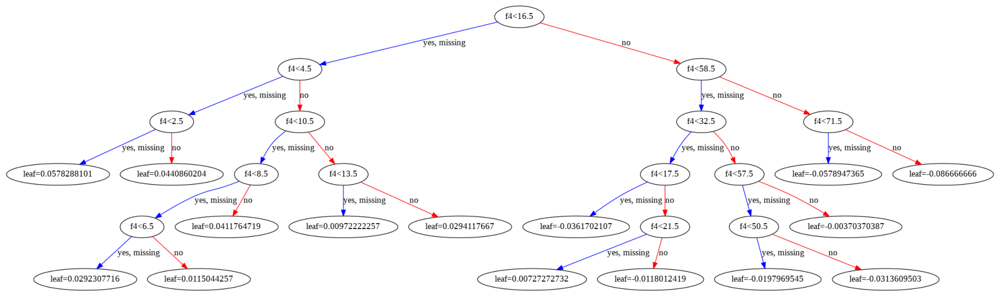

In [ ]:
#plot tree
from xgboost import plot_tree

fig,ax = plt.subplots(figsize=(30,30))
plot_tree(best_tree,ax=ax);

# Churn rate and revenue evaluation


As defined in [Section: What is Churn Rate? Why it is so important?](#scrollTo=vP0hpCu5EMn1), calculating the churn rate and churn revenue, is only possible if it determines a certain period of time. As our dataset do not have a datetime information, we will consider all the data is related to a specific period of time $t$.

Let's assume all the predicted clients are 100% converted, i.e., maintained their subscription until the end of the period. Moreover, we are dealing only with the `test_data`.

* Churn rate and Churn revenue:

<center>

Analysis|Real data|With prediction
-|-|-
Churn rate|25.3%|18.0%|
Churn revenue|415,419.6|224,181.8

</center>

In [ ]:
customer_t0 = len(y_test)
churn = (y_test=="Yes").sum()
predicted_correct = np.where(((y_pred==y_test) & (y_test=="Yes")),1,0).sum()
print(f"""Initial customers: {customer_t0}
      Churn customers: {churn} ({churn/customer_t0:.1%} from total)
      Correctly predicted: {predicted_correct} ({predicted_correct/churn:.1%} converted clients)""")

revenue_t0 = (X_test['MonthlyCharges']*X_test['tenure']).sum()
idx_churn_clients = [y_test[y_test=='Yes']][0].index
revenue_churn = (X_test.loc[idx_churn_clients,'MonthlyCharges']*X_test.loc[idx_churn_clients,'tenure']).sum()
idx_predicted_correct = y_test[(y_pred==y_test) & (y_test=="Yes")].index
revenue_churn_predicted = (X_test.loc[idx_predicted_correct,'MonthlyCharges']*X_test.loc[idx_predicted_correct,'tenure']).sum()

print(f"""\n\nInitial revenue: {revenue_t0:.1f}
      Churn revenue: {revenue_churn:.1f} ({revenue_churn/revenue_t0:.1%} from total)
      Converted revenue: {revenue_churn_predicted:.1f} ({revenue_churn_predicted/revenue_churn:.1%} converted revenue)""")

print(f"\n\nChurn rate w/o prediction: {churn/customer_t0:.1%}")
print(f"----> Churn rate w/ prediction: {predicted_correct/customer_t0:.1%} ({1-churn/predicted_correct:.1%} decrease)")
print(f"\nChurn revenue w/o prediction: {revenue_churn:.1f}")
print(f"----> Churn revenue w/ prediction: {revenue_churn_predicted:.1f} ({1-revenue_churn_predicted/revenue_churn:.1%} decrease)")

Initial customers: 1057
      Churn customers: 267 (25.3% from total)
      Correctly predicted: 190 (71.2% converted clients)


Initial revenue: 2461254.2
      Churn revenue: 415419.6 (16.9% from total)
      Converted revenue: 224181.8 (54.0% converted revenue)


Churn rate w/o prediction: 25.3%
----> Churn rate w/ prediction: 18.0% (-40.5% decrease)

Churn revenue w/o prediction: 415419.6
----> Churn revenue w/ prediction: 224181.8 (46.0% decrease)


#Conclusion

main topics

* churn rate is important to measure the retain clients in the company and then identify bad services, products or processes.
* To do so, using the public datasabe, we apply the XGBoost Classfier algorithm to predict if a client would churn based on the clients informations.
* This kind of problem involved deep analysis on the data, feature correlation using $\phi_K$ methodolody and bivariate graphs. Moreover, the data had to be balanced applying Unsersampling method and had categorical features to be One-Hot encoded.
* For tuning, it's needed to know more deeply the mathematics behind and understand the parameters involved. Also, we used the GridSearch Cross-validation approach to identify better parameters, i.e., more accurate and faster enough.
* To conclude, the problem to identify the churn client relies more on bussiness problem than a statistical approach, since the feature `MonthlyCharges` had more impact in the tree-based model.